# 导入库

In [1]:
#导入相应的库
import cv2
import sklearn
import imgaug as ia
from imgaug import augmenters as iaa
import numpy as np

#测试集目录
test_base = './datasets/test/'
test_error_pic = test_base+'error_pic/'
test_no_error_pic = test_base+'no_error_pic/'
test_no_error_pic_2 = test_base+'no_error_pic_2/'
test_data_error_diffpic =test_base+'data/error_diffpic/'
test_data_no_error_diffpic =test_base+'data/no_error_diffpic/'
#训练集目录
train_base = './datasets/train/'
train_error_pic = train_base+'error_pic/'
train_no_error_pic = train_base+'no_error_pic/'
train_no_error_pic_2 = train_base+'no_error_pic_2/'
train_data_error_diffpic =train_base+'data/error_diffpic/'
train_data_no_error_diffpic =train_base+'data/no_error_diffpic/'

# 功能函数

In [2]:
# 功能函数

def get_pics_list(path):
    return os.listdir(path)

def get_pic(filepath, filename):
    return cv2.imread(filepath+filename)[:,:,::-1]
    #BGR->RGN example_img = example_img[:,:,::-1]

def save_pic(img, filepath, filename):
    cv2.imwrite(filepath+filename, img)

import os
import matplotlib
import matplotlib.pyplot as plt

def show_pic(path, image_list, num):
    '''
        path: base path
        image_list: list of pic name
        num: how many pics in one line
    '''
    fig, ax = plt.subplots(int((len(image_list)+1)/num), num, figsize=(50, 50))
    for index, fx in enumerate(ax):
        for fy, lbl in zip(fx, image_list[index*num:(len(image_list) if (index+1)*num > len(image_list) else (index+1)*num)]):
            img = cv2.imread(os.path.join(path, lbl))[:,:,::-1]
            fy.imshow(img)
            fy.set_title(lbl)
            fy.axes.get_xaxis().set_visible(False)
            fy.axes.get_yaxis().set_visible(False)

matplotlib.rcParams['font.size'] = 18

## 60张数据集 分为测试集和训练集

训练集-划痕-样本
测试集-划痕-样本


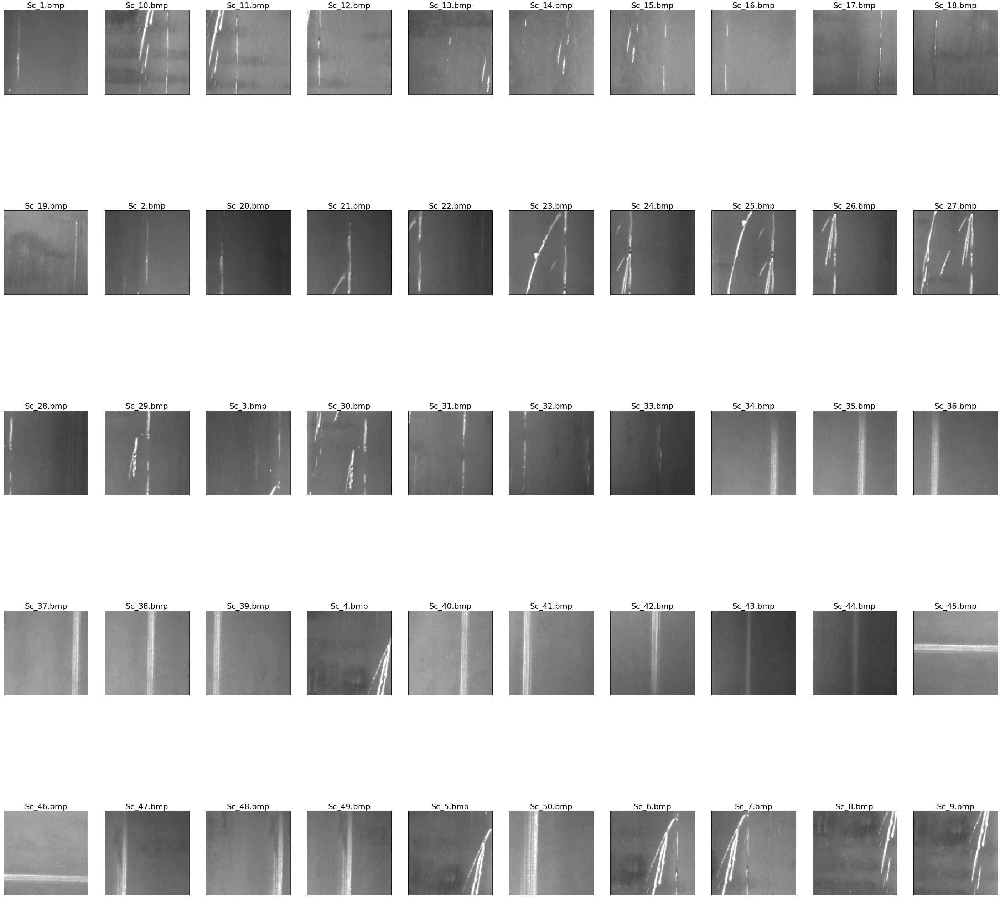

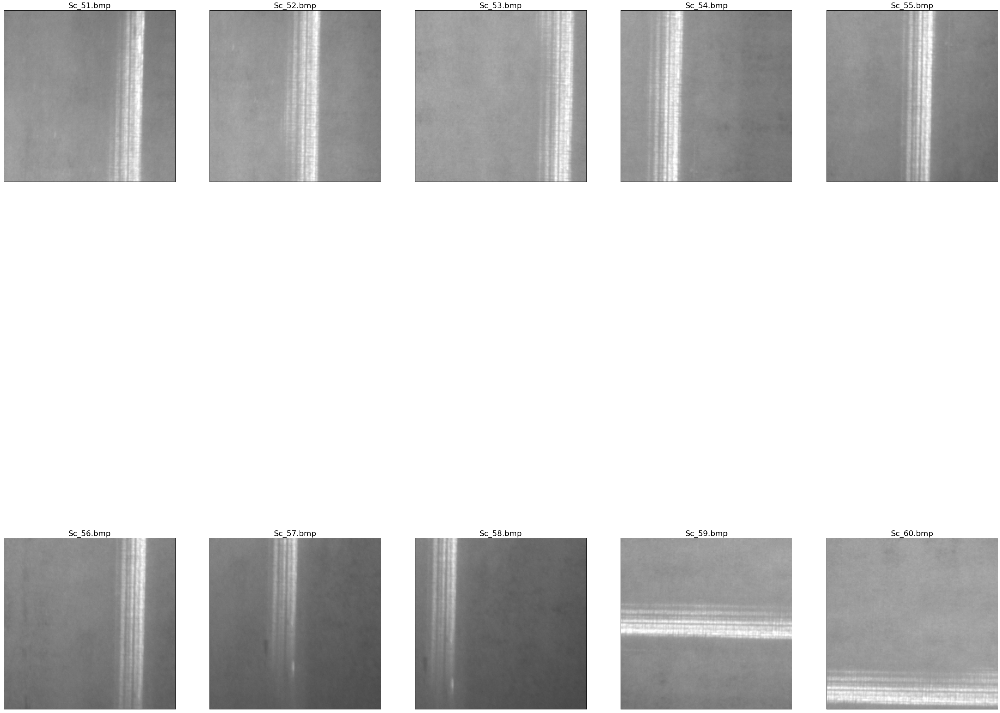

In [3]:
print("训练集-划痕-样本")
show_pic(train_error_pic, get_pics_list(train_error_pic), 10)
print("测试集-划痕-样本")
show_pic(test_error_pic, get_pics_list(test_error_pic), 5)

## 数据集生成

In [8]:
# 数据集生成

# no_error_pic是生成的无损伤数据

# imgaug数据集增强库
# no_error_pic_2对no_error_pic中的图片做随机扭曲和其他操作
def generate_new_pic(pic):
    ia.seed(3)
    seq = iaa.Sequential([
        #从图片边随机裁剪像素,裁剪后图片的尺寸和之前不一致
        #因为传送带相对稳定，所以这块裁剪小一点
        #通过设置keep_size为True可以保证裁剪后的图片和之前的一致
        iaa.Crop(px=(0,20),keep_size=True),
        #50%的概率水平翻转（模拟零件反过来放置）
        iaa.Fliplr(0.5),
        #50%的概率垂直翻转
        iaa.Flipud(0.5),
        #增加或者降低对比度
        iaa.contrast.LinearContrast((0.75, 1.25)),
        #改变亮度
        iaa.Multiply((0.75,1.25), per_channel=0.1)
    ],
    random_order=True
    )
    img = seq.augment_image(pic)
    return img

# 把no_error_pic中的图片 全部随机生成新图片 存到 no_error_pic2中
# Train
train_no_list = get_pics_list(train_no_error_pic)
for picname in train_no_list:
    pic = get_pic(filepath=train_no_error_pic,filename=picname)
    newpic = generate_new_pic(pic)
    save_pic(newpic,train_no_error_pic_2,picname)
train_no_list_2 = get_pics_list(train_no_error_pic_2)

# Test
test_no_list = get_pics_list(test_no_error_pic)
for picname in test_no_list:
    pic = get_pic(filepath=test_no_error_pic,filename=picname)
    newpic = generate_new_pic(pic)
    save_pic(newpic,test_no_error_pic_2,picname)
test_no_list_2 = get_pics_list(test_no_error_pic_2)


训练集-无划痕-样本
训练集-无划痕-生成样本


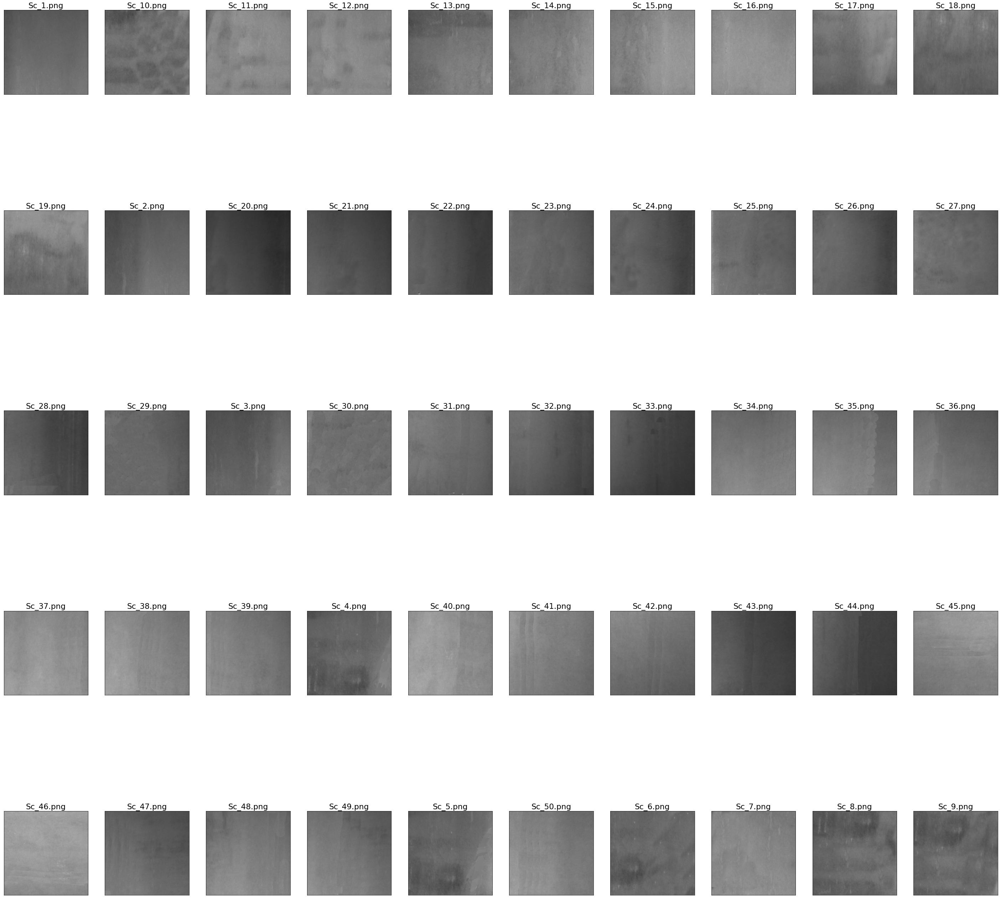

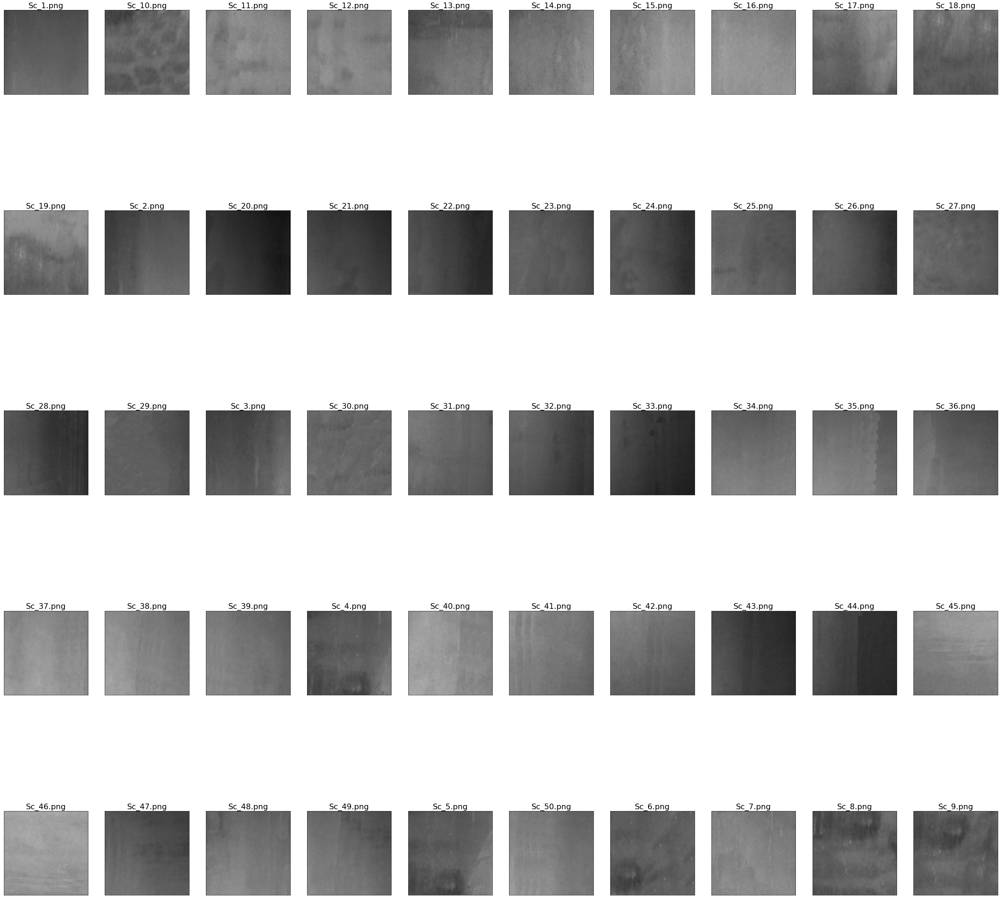

In [9]:
if train_no_list:
    print("训练集-无划痕-样本")
    show_pic(train_no_error_pic, get_pics_list(train_no_error_pic), 10)
    print("训练集-无划痕-生成样本")
    show_pic(train_no_error_pic_2, get_pics_list(train_no_error_pic_2), 10)

测试集-无划痕-样本
测试集-无划痕-生成样本


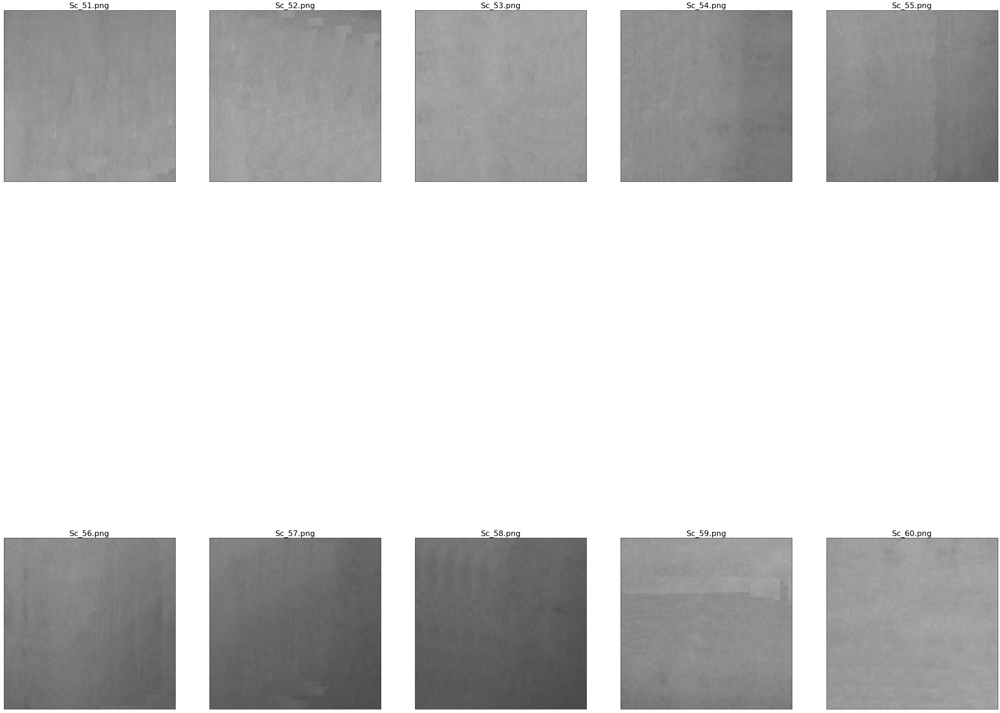

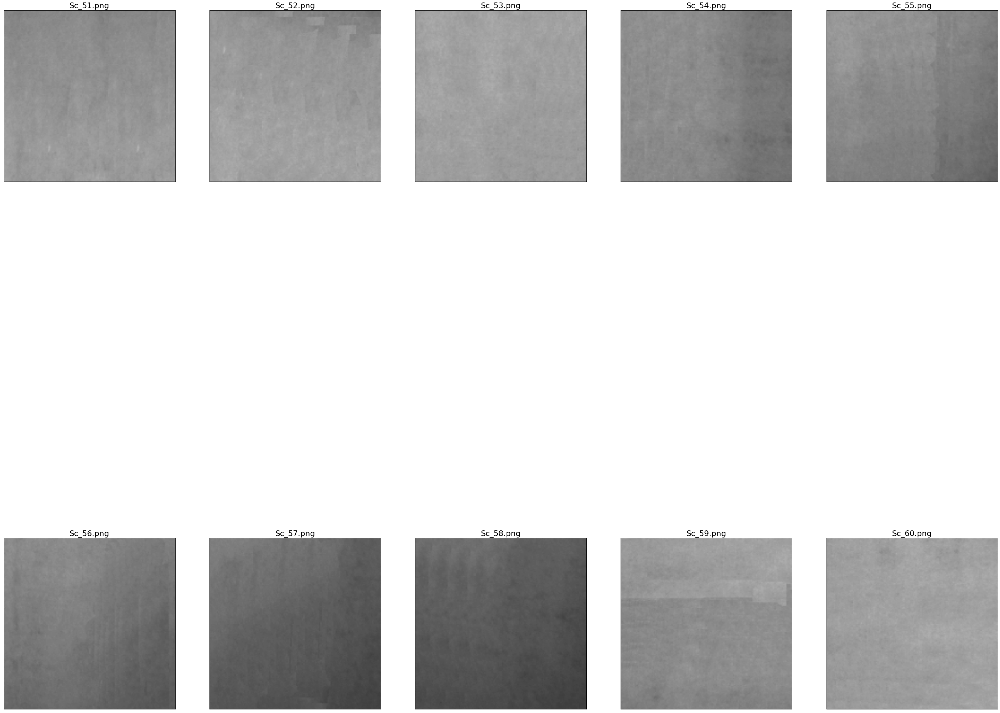

In [10]:
if test_no_list:
    print("测试集-无划痕-样本")
    show_pic(test_no_error_pic, get_pics_list(test_no_error_pic), 5)
    print("测试集-无划痕-生成样本")
    show_pic(test_no_error_pic_2, get_pics_list(test_no_error_pic_2), 5)

## 图像预处理

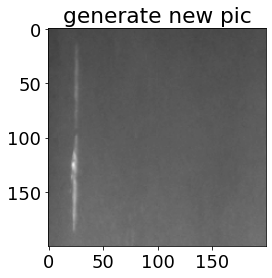

In [25]:
# 配准
# 特征点匹配
###用第一张图片做参考图像，对第二张图像进行对齐
#####基于图像特征对齐，利用ORB寻找对应点
########https://blog.csdn.net/yuanlulu/article/details/82222119
MAX_FEATURES = 500
GOOD_MATCH_PERCENT = 0.15
def align(pic1,pic2):
    # Convert images to grayscale
    im1Gray = cv2.cvtColor(pic1, cv2.COLOR_BGR2GRAY)
    im2Gray = cv2.cvtColor(pic2, cv2.COLOR_BGR2GRAY)

    # Detect ORB features and compute descriptors.
    orb = cv2.ORB_create(MAX_FEATURES)
    keypoints1, descriptors1 = orb.detectAndCompute(im1Gray, None)
    keypoints2, descriptors2 = orb.detectAndCompute(im2Gray, None)

    # Match features.
    matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(descriptors1, descriptors2, None)

    matches=list(matches)
    # Sort matches by score
    matches.sort(key=lambda x: x.distance, reverse=False)

    # Remove not so good matches
    numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
    matches = matches[:numGoodMatches]

    # Draw top matches
    imMatches = cv2.drawMatches(pic1, keypoints1, pic2, keypoints2, matches, None)
    cv2.imwrite("matches.jpg", imMatches)

    # Extract location of good matches
    points1 = np.zeros((len(matches), 2), dtype=np.float32)
    points2 = np.zeros((len(matches), 2), dtype=np.float32)

    for i, match in enumerate(matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt

    # Find homography
    h, mask = cv2.findHomography(points1, points2, cv2.RANSAC)

    # Use homography
    height, width, channels = pic1.shape
    im1Reg = cv2.warpPerspective(pic1, h, (width, height))

    return im1Reg, h

def alignimages(pic1,pic2):
    # Read reference image
    imReference = cv2.cvtColor(pic1, cv2.IMREAD_COLOR)

    # Read image to be aligned
    im = cv2.cvtColor(pic2, cv2.IMREAD_COLOR)

    # print("Aligning images ...")
    # Registered image will be resotred in imReg.
    # The estimated homography will be stored in h.
    imReg, h = align(im, imReference)

    # Write aligned image to disk.
    # outFilename = "aligned.jpg"
    # print("Saving aligned image : ", outFilename)
    return imReg


# 配准会出现意想不到的问题，比如图片里面会有黑色的区域出现，我认为一定程度会影响分类效果
# 需要配准的只是做了增强的图片，未增强的图片和原图是严格对齐的

# list1 = get_pics_list(train_error_pic)
# print(list1)
# pic1 = get_pic(train_error_pic,list1[0])
# pic2 = get_pic(train_error_pic,list1[1])
# alignimages(pic1,pic2,train_no_error_pic,list1[0])

list1 = get_pics_list(train_error_pic)
pic1 = get_pic(train_error_pic,list1[0])
img=generate_new_pic(pic1)
plt.figure("generate new pic") # 图像窗口名称
plt.imshow(img)
plt.axis('on') # 关掉坐标轴为 off
plt.title('generate new pic') # 图像题目
plt.show()

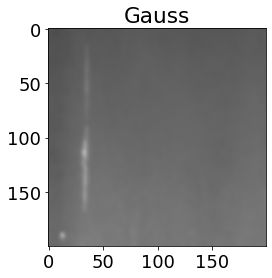

In [12]:
# 平滑预处理去噪

def denoise(img,l=5,r=5):
    '''
    输入img是经过imread后的图片文件流
    默认是5*5卷积核, 高斯滤波
    '''
    return cv2.GaussianBlur(img, (9, 9),0)

list1 = get_pics_list(train_error_pic)
# print(list1)
pic1 = get_pic(train_error_pic,list1[0])
# pic2 = get_pic(train_error_pic,list1[1])
img = denoise(pic1)
plt.figure("Gauss") # 图像窗口名称
plt.imshow(img)
plt.axis('on') # 关掉坐标轴为 off
plt.title('Gauss') # 图像题目
plt.show()


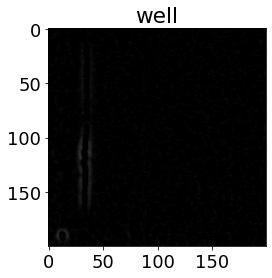

In [13]:
# well算子 图像边缘增强

def well(pic):
    kernel = np.array((
        [0, 1, 1, 1, 0],
        [1, 1, -3, 1, 1],
        [1, -4, -2, -4, 1 ],
        [1,1,-3,1,1],
        [0,1,1,1,0]
        ), dtype="float32")

    dst = cv2.filter2D(pic, -1, kernel)
    return dst
    
# list1 = get_pics_list(train_error_pic)
# print(list1)
# pic1 = get_pic(train_error_pic,list1[32])
# pic2 = get_pic(train_error_pic,list1[1])
img = well(img)
plt.figure("well") # 图像窗口名称
plt.imshow(img)
plt.axis('on') # 关掉坐标轴为 off
plt.title('well') # 图像题目
plt.show()

## 计算差分图像

In [17]:
def diffpic(pic,refpic):
    # 配准
    # 为了图像匹配没有黑边 以生成的图片为基准配准图像
    # newpic = alignimages(refpic,pic)
    # newpic是pic配准后的图像
    
    # 高斯去噪
    newpic=denoise(pic)
    refpic=denoise(refpic)
    
    # well增强
    newpic=well(newpic)
    refpic=well(refpic)

    # 图像差分
    diff = cv2.absdiff(newpic, refpic)
    return diff

def run():
    train_filename_list = get_pics_list(train_error_pic)  # bmp
    train_filename_list_2 = get_pics_list(train_no_error_pic) # png
    # 训练集有裂纹样本的差分图
    for picname,picname2 in zip(train_filename_list,train_filename_list_2):
        pic = get_pic(train_error_pic,picname)
        refpic = get_pic(train_no_error_pic_2,picname2)
        diff = diffpic(pic,refpic)
        save_pic(diff,train_data_error_diffpic,'diff_'+picname)
    # 训练集无裂纹样本的差分图
    for picname,picname2 in zip(train_filename_list,train_filename_list_2):
        pic = get_pic(train_no_error_pic,picname2)
        refpic = get_pic(train_no_error_pic_2,picname2)
        diff = diffpic(pic,refpic)
        save_pic(diff,train_data_no_error_diffpic,'diff_'+picname)

    test_filename_list = get_pics_list(test_error_pic)  # bmp
    test_filename_list_2 = get_pics_list(test_no_error_pic) # png
    # 测试集有裂纹样本的差分图
    for picname,picname2 in zip(test_filename_list,test_filename_list_2):
        pic = get_pic(test_error_pic,picname)
        refpic = get_pic(test_no_error_pic_2,picname2)
        diff = diffpic(pic,refpic)
        save_pic(diff,test_data_error_diffpic,'diff_'+picname)
    # 测试集无裂纹样本的差分图
    for picname,picname2 in zip(test_filename_list,test_filename_list_2):
        pic = get_pic(test_no_error_pic,picname2)
        refpic = get_pic(test_no_error_pic_2,picname2)
        diff = diffpic(pic,refpic)
        save_pic(diff,test_data_no_error_diffpic,'diff_'+picname)
        
# 只运行一次就行，保存到对应目录
run()

训练集-有划痕-差分图
测试集-无划痕-差分图


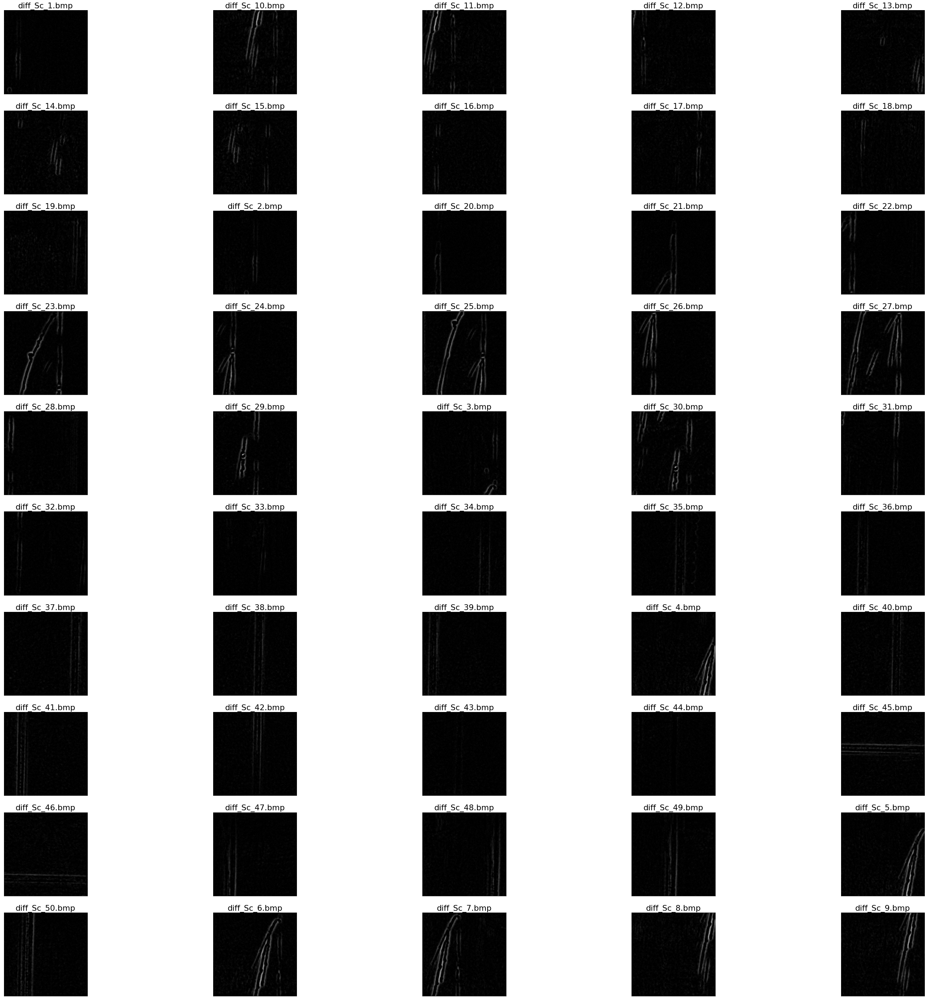

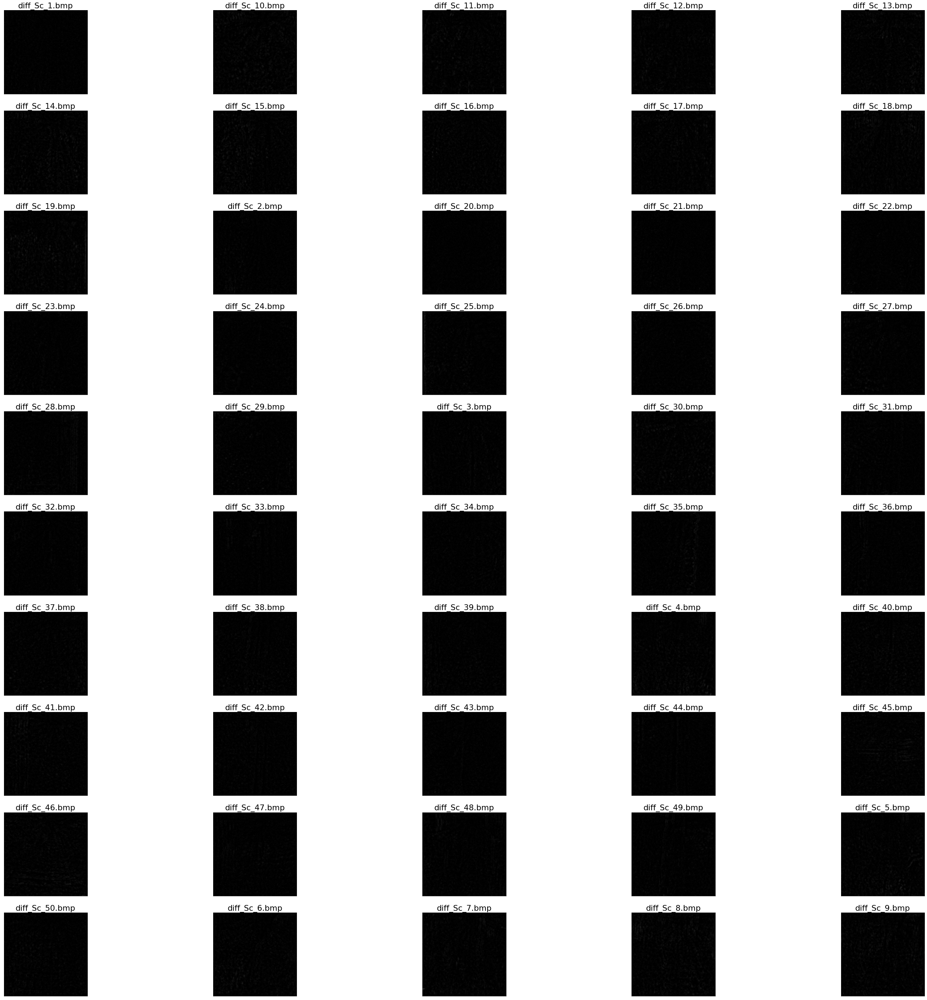

In [19]:
print("训练集-有划痕-差分图")
show_pic(train_data_error_diffpic, get_pics_list(train_data_error_diffpic), 5)
print("测试集-无划痕-差分图")
show_pic(train_data_no_error_diffpic, get_pics_list(train_data_no_error_diffpic), 5)

## 对差分图像训练SVM模型

In [20]:
# 提HOG特征值
piclist= get_pics_list(train_error_pic)
pic = get_pic(train_error_pic,piclist[0])

from skimage.feature import hog
# hog_feat, hog_img = hog(pic, visualize=True)

def get_hog(pic):
    return hog(pic, visualize=False)

hog_va= get_hog(pic)
print(hog_va)


[0.208202   0.0498389  0.12716273 ... 0.05990932 0.01678636 0.01919593]


In [22]:
# 训练集
train_error_list = []
train_no_error_list = []
train_filename_list= get_pics_list(train_data_error_diffpic) #两个数据集的名字一样
for picname in train_filename_list:
    error_pic = get_pic(train_data_error_diffpic,picname)
    train_error_list.append(get_hog(error_pic))
    no_error_pic = get_pic(train_data_no_error_diffpic,picname)
    train_no_error_list.append(get_hog(no_error_pic))
print(train_error_list)
train_data = train_error_list + train_no_error_list

train_error_label = [1] * len(train_filename_list)
train_no_error_label = [0] * len(train_filename_list)
train_label = train_error_label + train_no_error_label

# 测试集
test_error_list = []
test_no_error_list = []
test_filename_list= get_pics_list(test_data_error_diffpic) #两个数据集的名字一样
for picname in test_filename_list:
    error_pic = get_pic(test_data_error_diffpic,picname)
    test_error_list.append(get_hog(error_pic))
    no_error_pic = get_pic(test_data_no_error_diffpic,picname)
    test_no_error_list.append(get_hog(no_error_pic))

test_data = test_error_list + test_no_error_list

test_error_label = [1] * len(test_filename_list)
test_no_error_label = [0] * len(test_filename_list)
test_label = test_error_label + test_no_error_label



[array([0.21702426, 0.03861794, 0.11936994, ..., 0.0977591 , 0.01922856,
       0.04489847]), array([0.12590381, 0.09626399, 0.07082785, ..., 0.06401214, 0.04761591,
       0.02660436]), array([0.15614365, 0.03518404, 0.02462413, ..., 0.05180954, 0.10032831,
       0.04132187]), array([0.2762577 , 0.04024569, 0.00356434, ..., 0.06668642, 0.24187942,
       0.24187942]), array([0.21062534, 0.09643189, 0.09311167, ..., 0.00098543, 0.02349799,
       0.03462288]), array([0.20124279, 0.08132106, 0.10645655, ..., 0.05036973, 0.08074851,
       0.03809135]), array([0.1927779 , 0.02909168, 0.08307885, ..., 0.08306453, 0.12048247,
       0.        ]), array([0.12742551, 0.03195856, 0.08344625, ..., 0.08732417, 0.17322267,
       0.        ]), array([0.07933649, 0.14024245, 0.08853072, ..., 0.02959886, 0.05656751,
       0.10242358]), array([0.17390326, 0.1463942 , 0.05692008, ..., 0.02685579, 0.11757357,
       0.15621383]), array([0.21552642, 0.12461914, 0.09064465, ..., 0.16471774, 0.0754720

In [23]:
# 支持向量机
from sklearn import svm

# 用相同的随机数打乱数据
import random
# 训练数据
randnum = random.randint(0,20)
random.seed(randnum)
random.shuffle(train_data)
random.seed(randnum)
random.shuffle(train_label)

print(train_data)
# 不一定需要下面这步
# train_data = np.array(train_data).reshape(-1,1)
# print(train_data)
# 测试数据
randnum = random.randint(0,100)
random.seed(randnum)
random.shuffle(test_data)
random.seed(randnum)
random.shuffle(test_label)

# test_data = np.array(test_data)
# print(test_data)
# test_data = test_data.reshape(-1, 1)
# print(test_data)

# print(train_data)
# print(train_label)
# print(test_data)
# print(test_label)

# select different type of kernel function and compare the score

# kernel = 'rbf'
clf_rbf = svm.SVC(kernel='rbf')
clf_rbf.fit(train_data, train_label)
score_rbf = clf_rbf.score(test_data, test_label)
print("The score of rbf is : %f"%score_rbf)

[array([0.21062534, 0.09643189, 0.09311167, ..., 0.00098543, 0.02349799,
       0.03462288]), array([0.20937213, 0.12161719, 0.06607049, ..., 0.0061005 , 0.00964574,
       0.04927792]), array([0.11666808, 0.        , 0.08232273, ..., 0.02784986, 0.12280381,
       0.07250221]), array([0.21702426, 0.03861794, 0.11936994, ..., 0.0977591 , 0.01922856,
       0.04489847]), array([0.19717645, 0.09937668, 0.06658475, ..., 0.05084909, 0.06146295,
       0.07028068]), array([0.21062534, 0.09643189, 0.09311167, ..., 0.06002877, 0.19168224,
       0.17658605]), array([0.12498898, 0.0089916 , 0.06624273, ..., 0.0495047 , 0.06408749,
       0.05395801]), array([0.18222518, 0.09546773, 0.09748939, ..., 0.06262972, 0.09624991,
       0.03411292]), array([0.22202737, 0.08285218, 0.02984955, ..., 0.18142174, 0.03255216,
       0.        ]), array([0.19237026, 0.14038364, 0.0799099 , ..., 0.12192638, 0.11460288,
       0.04310511]), array([0.10445996, 0.05094891, 0.08513529, ..., 0.04523005, 0.0660566